# How to integrate across all sources

In [3]:
library(Seurat)
library(ggplot2)
suppressPackageStartupMessages(library(dplyr))
library(glue)
suppressPackageStartupMessages(library(S4Vectors))
suppressPackageStartupMessages(library(GenomicRanges))
library(patchwork)
library(biomaRt)
library(harmony)
library(reticulate)

Attaching SeuratObject

Loading required package: Rcpp



## Step 3: Cell annotation

In [8]:
harmonized_data <- readRDS("/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/202504_freeze/filtered_round2__min.cells1_min.features1_rmIndivDblts_rmClustAbv65pct_harmonized_data_enrichedCells.Rds")
print(harmonized_data)

An object of class Seurat 
19546 features across 448935 samples within 1 assay 
Active assay: RNA (19546 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony


In [9]:
Idents(harmonized_data) <- as.factor(harmonized_data@meta.data$`RNA_snn_res.1.8`)
Idents(harmonized_data) <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))
harmonized_data$seurat_clusters <- factor(Idents(harmonized_data), levels=1:max(as.numeric(Idents(harmonized_data))))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



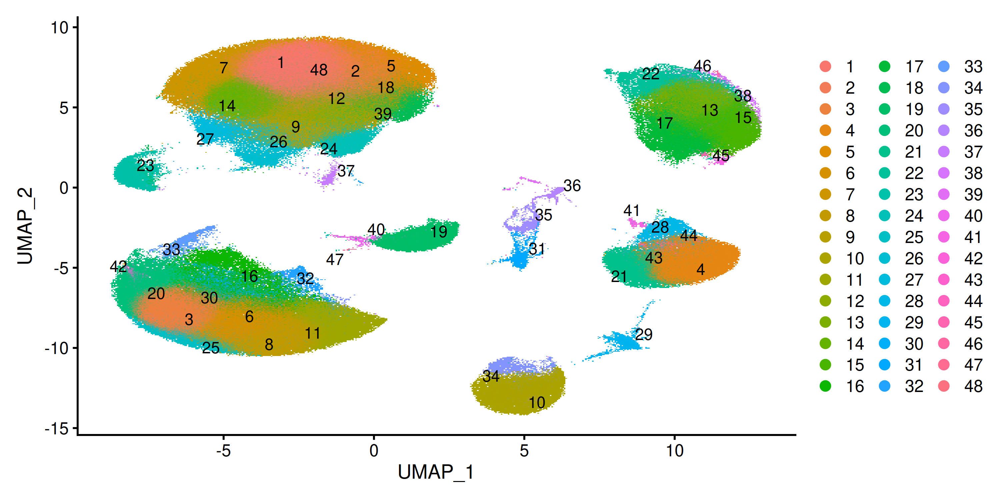

In [10]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(harmonized_data, label = T, repel = T)

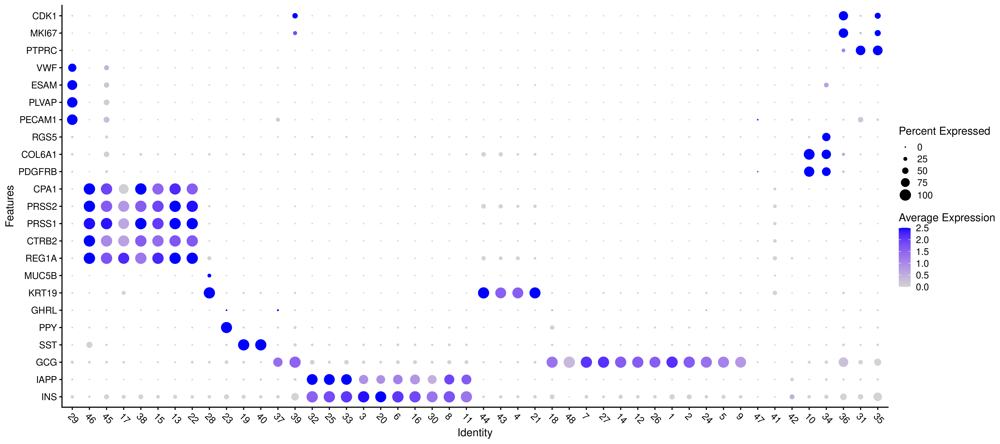

In [11]:
markers <- c('INS', 'IAPP', #Beta
             'GCG', #Alpha
             'SST', #Delta
             'PPY', #Gamma
             'GHRL', #Epsilon
             'KRT19', #Ductal
             'MUC5B', #MUC5B+ Ductal
             'REG1A', 'CTRB2', 'PRSS1', 'PRSS2', "CPA1", #Acinar
             'PDGFRB', 'COL6A1', 'RGS5', #Stellate
             'PECAM1', 'PLVAP','ESAM','VWF', #Endothelial
             'PTPRC', #Immune,
             'MKI67','CDK1') #Dividing cells
options(repr.plot.width = 18, repr.plot.height = 8, repr.plot.res = 300)

DotPlot(harmonized_data, features = markers, cluster.idents = TRUE, col.min = 0, scale = T) +
  theme(axis.text.x = element_text(angle = -45, hjust = 0)) + coord_flip()

In [12]:
harmonized_data <- RenameIdents(harmonized_data,
                                `29` = "Endothelial", `31` = "Immune",
                                `46` = "Acinar", `45` = "Acinar", `17` = "Acinar", 
                                `38` = "Acinar", `15` = "Acinar", `13` = "Acinar", 
                                `22` = "Acinar", `10` = "Active Stellate",
                                `34` = "Quiescent Stellate", `35` = "Cycling Alpha", 
                                `36` = "Cycling Alpha", `39` = "Alpha",
                                `23` = "Gamma + Epsilon", `28` = "MUC5B+ Ductal",
                                `19` = "Delta", `40` = "Delta", `48` = "Alpha",
                                `32` = "Beta", `25` = "Beta", `33` = "Beta", 
                                `3` = "Beta", `20` = "Beta", `6` = "Beta", 
                                `16` = "Beta", `30` = "Beta", `8` = "Beta", 
                                `11` = "Beta", `41` = "Ductal", `21` = "Ductal",
                                `43` = "Ductal", `4` = "Ductal", `44` = "Ductal",
                                `37` = "Alpha", `42` = "Beta", `47` = "Delta",
                                `18` = "Alpha", `7` = "Alpha", `27` = "Alpha",
                                `14` = "Alpha", `12` = "Alpha", `26` = "Alpha",
                                `1` = "Alpha", `2` = "Alpha", `24` = "Alpha",
                                `5` = "Alpha", `9` = "Alpha")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



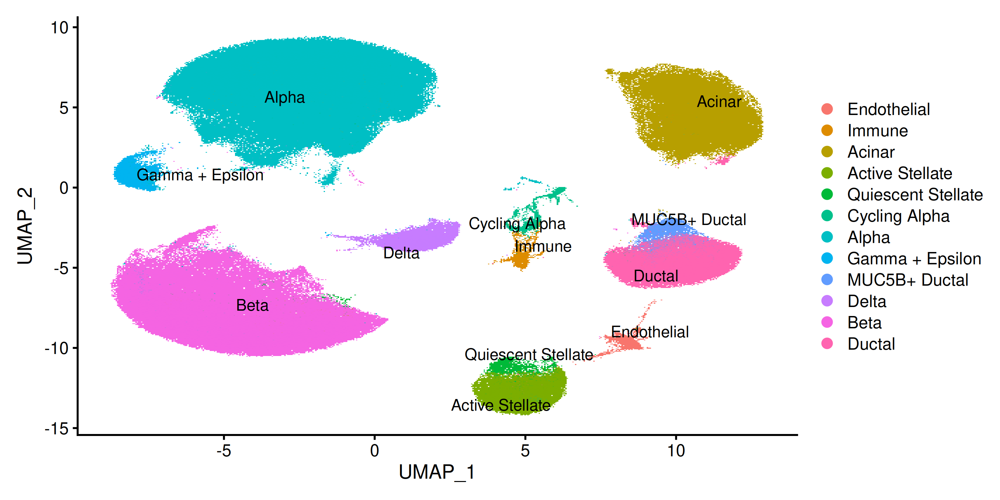

In [13]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
DimPlot(harmonized_data, label = T, repel = T)

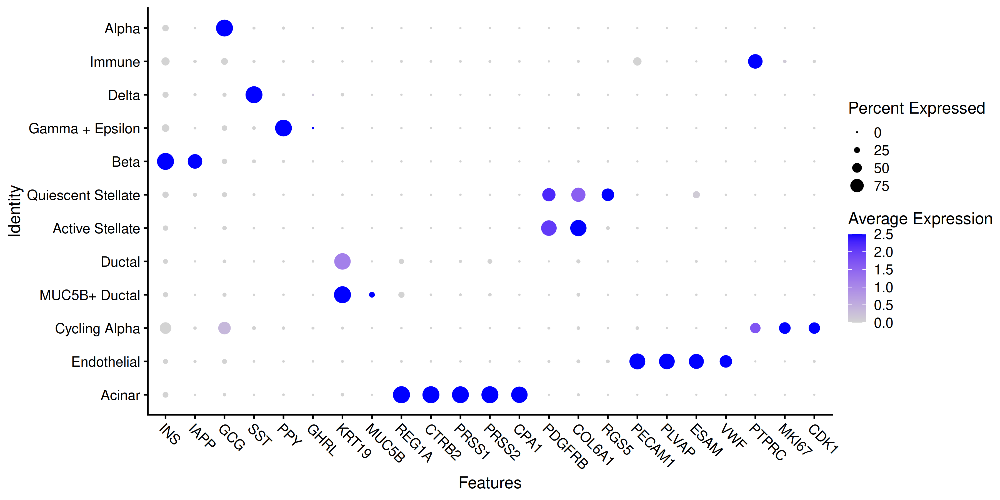

In [14]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 300)

DotPlot(harmonized_data, features = markers, cluster.idents = TRUE, col.min = 0, scale = T) +
  theme(axis.text.x = element_text(angle = -45, hjust = 0))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

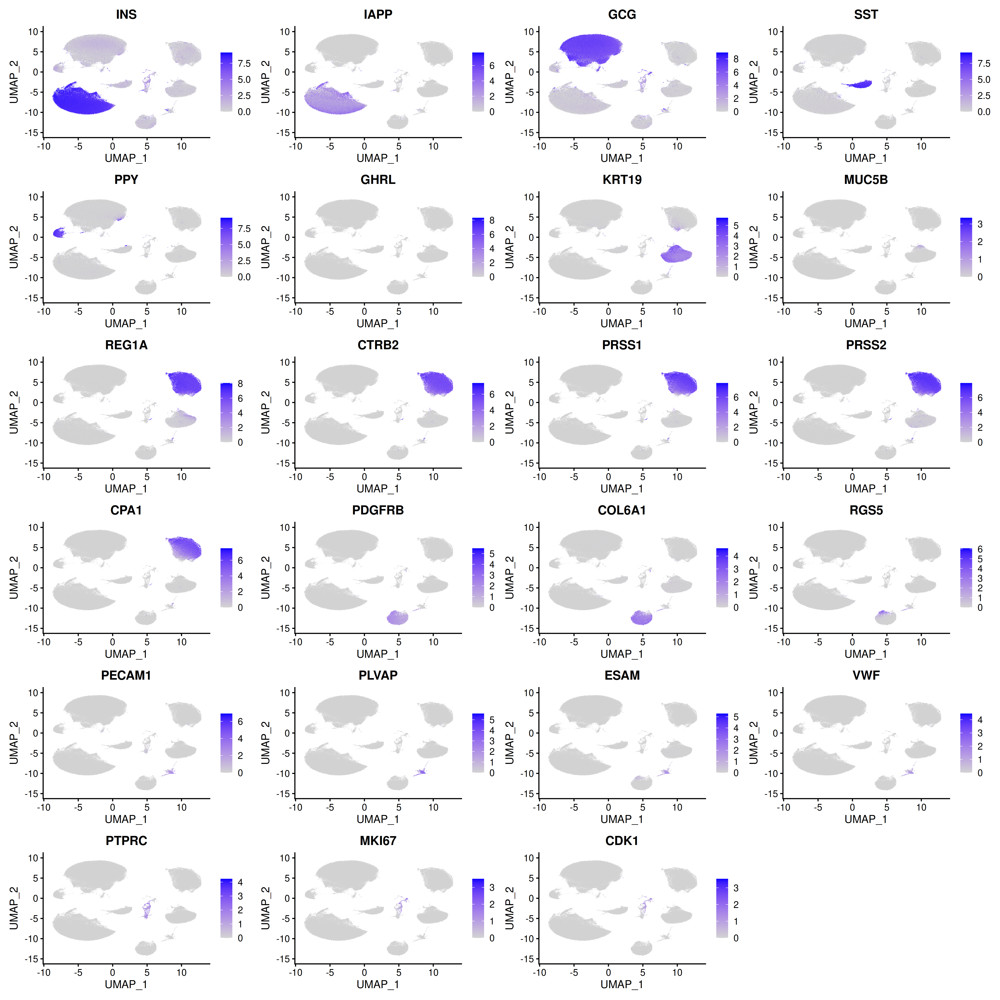

In [15]:
p <- FeaturePlot(harmonized_data, features = markers)

options(repr.plot.width = 18, repr.plot.height = 18, repr.plot.res = 300)
p

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



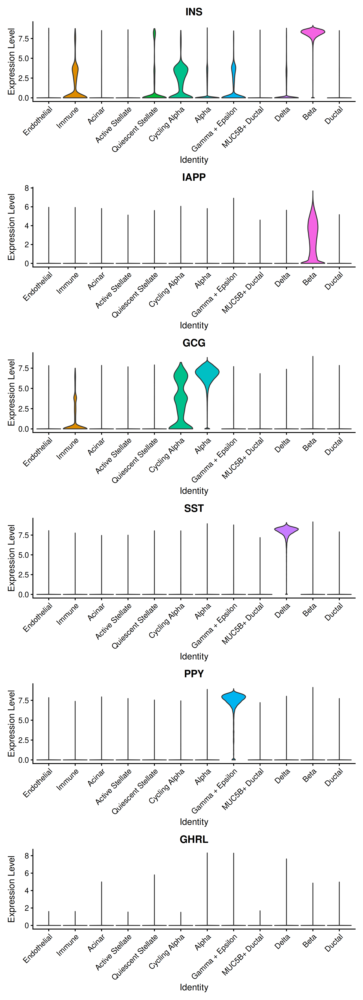

In [16]:
options(repr.plot.width = 8, repr.plot.height = 22, repr.plot.res = 300)
VlnPlot(harmonized_data, features = markers[1:6], pt.size = 0, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



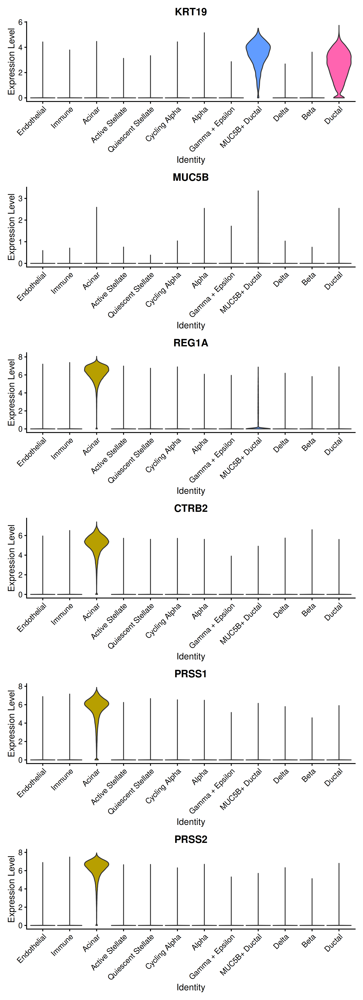

In [17]:
options(repr.plot.width = 8, repr.plot.height = 22, repr.plot.res = 300)
VlnPlot(harmonized_data, features = markers[7:12], pt.size = 0, ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



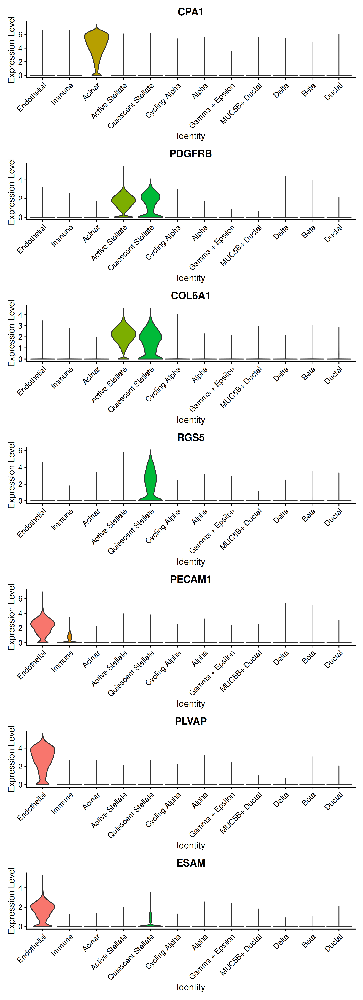

In [18]:
options(repr.plot.width = 8, repr.plot.height = 22, repr.plot.res = 300)
VlnPlot(harmonized_data, features = markers[13:19], pt.size = 0, ncol = 1)

Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: NA”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



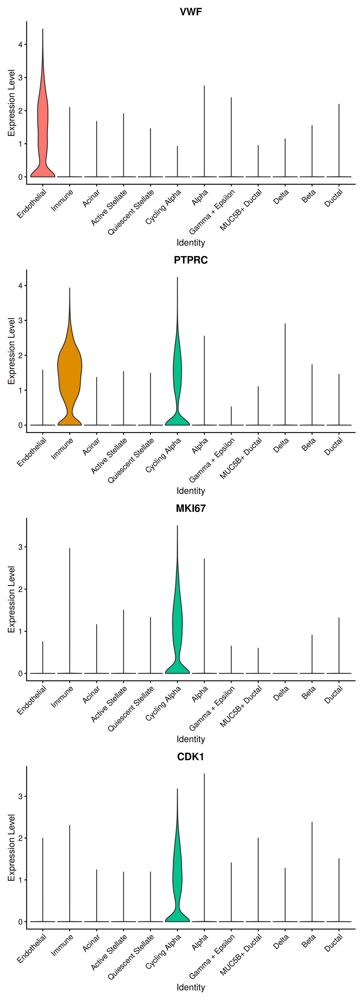

In [19]:
options(repr.plot.width = 8, repr.plot.height = 22, repr.plot.res = 300)
VlnPlot(harmonized_data, features = markers[20:26], pt.size = 0, ncol = 1)

Number of samples per tissue source:

In [20]:
df <- harmonized_data@meta.data[, c("samples", "source", "rrid")]
rownames(df) <- 1:nrow(df)
df <- distinct(df)
table(df$source)


 HPAP  IIDP Prodo 
   83    72    36 

Number of cells per tissue source:

In [21]:
table(harmonized_data@meta.data$source)


  HPAP   IIDP  Prodo 
174185 215583  59167 

Number of donors per tissue source:

In [22]:
df <- distinct(harmonized_data@meta.data[, c("source", "rrid")])
table(df$source)


 HPAP  IIDP Prodo 
   79    51    10 

Number of cells per cell type:

In [23]:
harmonized_data$coarse_annot <- Idents(harmonized_data)
c <- data.frame(table(harmonized_data$coarse_annot))
colnames(c) <- c("cell_type", "n_cells")
c[order(-c$n_cells),]

,cell_type,n_cells
,<fct>,<int>
7,Alpha,194443
11,Beta,120502
3,Acinar,50105
12,Ductal,33686
4,Active Stellate,16907
10,Delta,11680
8,Gamma + Epsilon,7087
9,MUC5B+ Ductal,3515
1,Endothelial,3385


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



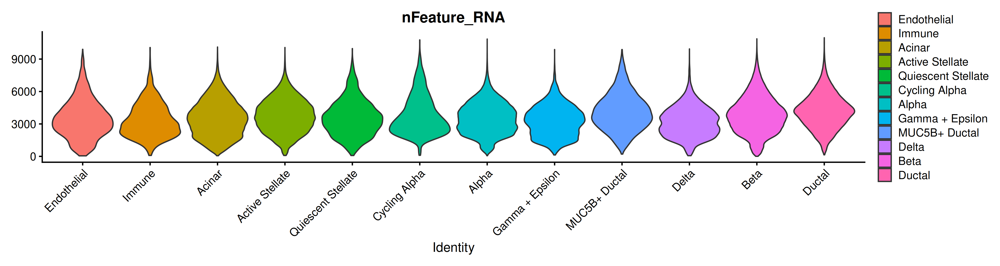

In [24]:
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 300)
# Visualize QC metrics as a violin plot
VlnPlot(harmonized_data, features = c("nFeature_RNA"), ncol = 1, pt.size = 0)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



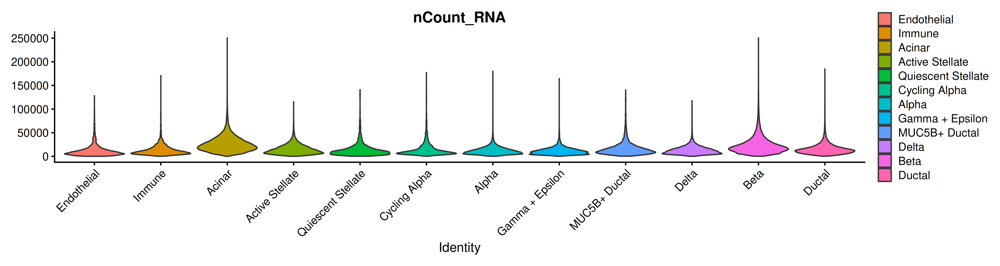

In [25]:
# Visualize QC metrics as a violin plot
VlnPlot(harmonized_data, features = c("nCount_RNA"), ncol = 1, pt.size = 0)

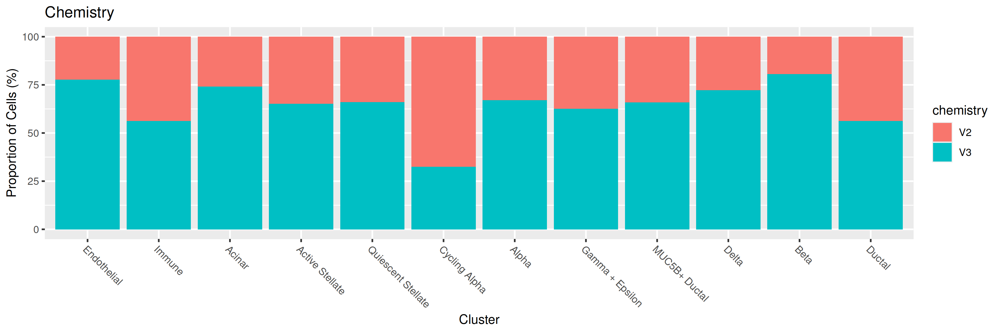

In [26]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$chemistry, harmonized_data$coarse_annot), margin = 2))
colnames(ggData) = c("chemistry", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = chemistry)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)") + ggtitle("Chemistry")

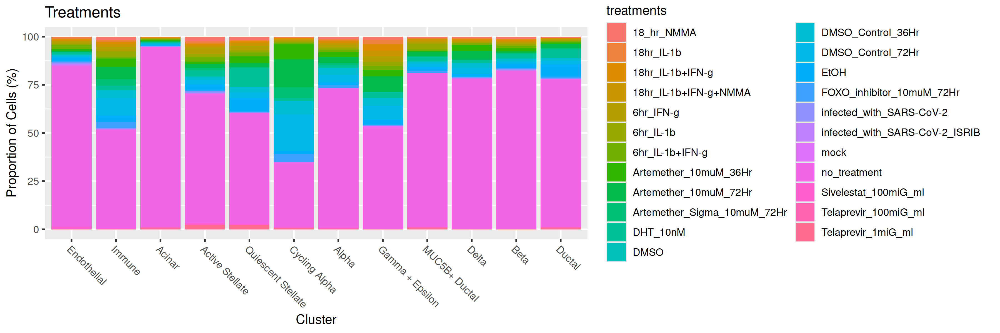

In [27]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$treatments, harmonized_data$coarse_annot), margin = 2))
colnames(ggData) = c("treatments", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = treatments)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)") + ggtitle("Treatments")

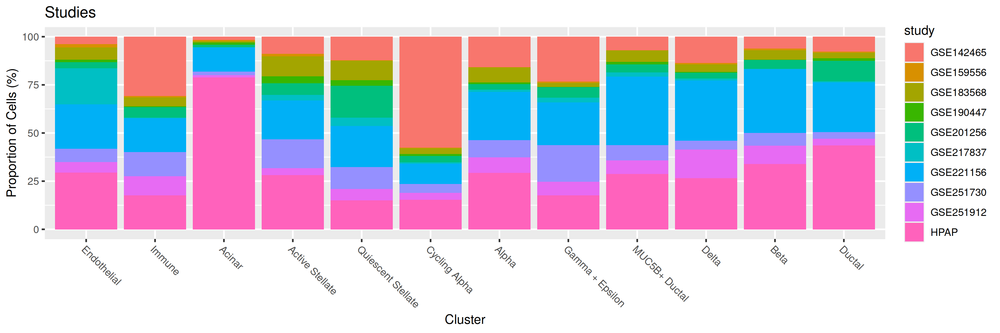

In [28]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)

ggData = data.frame(prop.table(table(harmonized_data$study, harmonized_data$coarse_annot), margin = 2))
colnames(ggData) = c("study", "cluster", "value")
ggplot(ggData, aes(cluster, value*100, fill = study)) + theme(axis.text.x = element_text(angle = -45, hjust = 0)) +
  geom_col() + xlab("Cluster") + ylab("Proportion of Cells (%)") + ggtitle("Studies")

Clean up metadata slots:

In [29]:
colnames(harmonized_data@meta.data)

[1] "orig.ident"                   "nCount_RNA"                  
 [3] "nFeature_RNA"                 "rownames"                    
 [5] "samples"                      "barcodes"                    
 [7] "study"                        "rrid"                        
 [9] "treatments"                   "chemistry"                   
[11] "sex"                          "age"                         
[13] "bmi"                          "diabetes_status_description" 
[15] "source"                       "ethnicity"                   
[17] "aab_gada"                     "aab_ia_2"                    
[19] "aab_iaa"                      "aab_znt8"                    
[21] "RNA_snn_res.1"                "seurat_clusters"             
[23] "RNA_snn_res.1.8"              "rna_total_reads"             
[25] "rna_uniquely_mapped_reads"    "rna_secondary_alignments"    
[27] "rna_supplementary_alignments" "rna_umis"                    
[29] "cell_probability"             "post_cellbender_umis"        
[31] "pct_cellbender_removed"       "rna_pct_mitochondrial"       
[33] "to_remove"                    "RNA_snn_res.3"               
[35] "RNA_snn_res.3.5"              "RNA_snn_res.4"               
[37] "enriched_cells"               "coarse_annot"

In [30]:
keep_col <- c('orig.ident', 'nCount_RNA', 'nFeature_RNA', 'samples', 'barcodes',
              'study', 'rrid', 'treatments', 'chemistry', 'sex', 'age', 'bmi', 
              'diabetes_status_description', 'source', 'ethnicity', 'aab_gada', 
              'aab_ia_2', 'aab_iaa', 'aab_znt8', 'RNA_snn_res.1.8', 'rna_total_reads',
              'rna_uniquely_mapped_reads', 'rna_secondary_alignments', 'rna_supplementary_alignments',
              'rna_umis', 'rna_fraction_mitochondrial', 'cell_probability', 'post_cellbender_umis',
              'pct_cellbender_removed', 'rna_pct_mitochondrial', 'coarse_annot')

In [31]:
tmp <- harmonized_data@meta.data[, colnames(harmonized_data@meta.data) %in% keep_col]
head(tmp)

,orig.ident,nCount_RNA,nFeature_RNA,samples,barcodes,study,rrid,treatments,chemistry,sex,⋯,rna_total_reads,rna_uniquely_mapped_reads,rna_secondary_alignments,rna_supplementary_alignments,rna_umis,cell_probability,post_cellbender_umis,pct_cellbender_removed,rna_pct_mitochondrial,coarse_annot
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
SRR12831418-TGACAACTCTGTCTAT,SeuratProject,6305,2608,SRR12831418,TGACAACTCTGTCTAT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,99915,88755,13865,0,11029,0.9999546,10826,1.840602,3.329390,Ductal
SRR12831418-ATCCGAATCGTTTATC,SeuratProject,4258,1702,SRR12831418,ATCCGAATCGTTTATC,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,71828,63288,12549,0,7759,0.9999546,7538,2.848305,6.084882,Ductal
SRR12831418-AACACGTGTCCAGTAT,SeuratProject,3847,1675,SRR12831418,AACACGTGTCCAGTAT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,74127,65100,12656,0,7298,0.9999546,7084,2.932310,6.259601,Ductal
SRR12831418-GAGTCCGTCCACGAAT,SeuratProject,2424,814,SRR12831418,GAGTCCGTCCACGAAT,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,63617,55668,15259,0,5558,0.9999546,5184,6.729039,2.310124,Active Stellate
SRR12831418-TACCTATTCGAATCCA,SeuratProject,2299,858,SRR12831418,TACCTATTCGAATCCA,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,55030,48792,9899,0,5346,0.9999546,4931,7.762813,3.184948,Active Stellate
SRR12831418-ATCCACCCACGAAACG,SeuratProject,2130,410,SRR12831418,ATCCACCCACGAAACG,GSE159556,HPAP-066,infected_with_SARS-CoV-2,V2,Female,⋯,47619,41253,14715,0,5242,0.9999546,4734,9.690958,3.648220,Active Stellate


In [32]:
harmonized_data@meta.data <- tmp

In [10]:
#saveRDS(harmonized_data, "/nfs/turbo/umms-scjp-pank/4_integration/results/202503_freeze/final__min.cells1_min.features1_rmIndivDblts_rmClustAbv55pct_harmonized_data.Rds")